In [1]:
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
%matplotlib inline
import getdist
from getdist import loadMCSamples, plots
import warnings
from copy import deepcopy

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import matplotlib.pyplot as plt
import matplotlib

# GENERAL PLOT OPTIONS
# GENERAL PLOT OPTIONS
matplotlib.rcParams['mathtext.fontset'] = 'stix'
matplotlib.rcParams['font.family'] = 'STIXGeneral'
matplotlib.rcParams['mathtext.rm'] = 'Bitstream Vera Sans'
matplotlib.rcParams['mathtext.it'] = 'Bitstream Vera Sans:italic'
matplotlib.rcParams['mathtext.bf'] = 'Bitstream Vera Sans:bold'
matplotlib.rcParams['xtick.bottom'] = True
matplotlib.rcParams['xtick.labelsize'] = 18
matplotlib.rcParams['xtick.top'] = False
matplotlib.rcParams['ytick.right'] = False
matplotlib.rcParams['ytick.labelsize'] = 18
matplotlib.rcParams['ytick.major.size'] = 6
matplotlib.rcParams['ytick.major.width'] = 1.2
matplotlib.rcParams['ytick.minor.size'] = 3
matplotlib.rcParams['ytick.minor.width'] = 0.8
matplotlib.rcParams['axes.edgecolor'] = 'black'
matplotlib.rcParams['axes.linewidth'] = '1.0'
matplotlib.rcParams['axes.labelsize'] = 18
matplotlib.rcParams['axes.titlesize'] = 24
matplotlib.rcParams['axes.grid'] = True
matplotlib.rcParams['grid.linewidth'] = '0.0'
matplotlib.rcParams['grid.alpha'] = '0.18'
matplotlib.rcParams['grid.color'] = 'lightgray'
matplotlib.rcParams['legend.labelspacing'] = 0.77
matplotlib.rcParams['legend.fontsize'] = 14
matplotlib.rcParams['legend.title_fontsize'] = 18
matplotlib.rcParams['savefig.bbox'] = 'tight'
matplotlib.rcParams['savefig.dpi'] = 300

from scipy.interpolate import interp1d
from scipy.integrate import quad

In [3]:

choice = 0
filepaths = [
    './data/roman_lcdm_baseline_mcmc/',
    './data/roman_les_lcdm_baseline_mcmc/',
    './data/roman_lcdm_SRDmask_mcmc/',
    './data/roman_les_lcdm_SRDmask_mcmc/'
    ]
labels = ['lens!=srcs \n DESY3 scalecut \n (baseline)',
          'lens=srcs  \n DESY3 scalecut',
          'lens!=srcs \n SRD   scalecut',
          'lens=srcs  \n SRD   scalecut']
cmap = plt.get_cmap("viridis")
colors = [tuple(cmap(x)) for x in np.linspace(0, 1, len(labels))]
def load(filepath, settings):
    samples = loadMCSamples(filepath, settings=settings)
    #samples.thin(50)
    
    #indxs = samples.random_single_samples_indices(max_samples=20000, random_state=0)
    #loglikes = None if samples.loglikes is None else samples.loglikes[indxs]
    #samples.setSamples(samples.samples[indxs], weights=None, loglikes=loglikes)
    
    p = samples.getParams()
    s8 = p.sigma8*(p.omegam/0.3)**0.5
    try:
        samples.addDerived(
            s8,
            'S8',
            label = r'S_8',
        )
    except:
        True
    return samples
settings = {'ignore_rows':0.2, 'contours': [0.68, 0.95]}
samples = []
for i in range(len(labels)):
    samples.append(load(filepaths[i], settings = settings))
    # clear wrong latex
    pn = samples[-1].getParamNames()
    latex_As = r'10^{9} A_{\rm s}'
    for p in pn.names:
        if p.name == 'mnu':
            p.label = r'm_{\nu}'
        if p.name.lower() == 'omegan':
            p.label = r'\Omega_{\nu}'
        if p.name == 'As_1e9':
            p.label = latex_As
fiducials ={
    'As_1e9': 2.1,
    'ns': 0.96605,
    'H0': 67.32,
    'omegab': 0.0495,
    'omegam': 0.316,
    'sigma8': 0.81164266,
    'mnu': 0.06,
    'w': -1.0,
    'roman_DZ_S1': 0.0,
    'roman_DZ_S2': 0.0,
    'roman_DZ_S3': 0.0,
    'roman_DZ_S4': 0.0,
    'roman_DZ_S5': 0.0,
    'roman_DZ_S6': 0.0,
    'roman_DZ_S7': 0.0,
    'roman_DZ_S8': 0.0,
    
    'roman_DZ_L1': 0.0,
    'roman_DZ_L2': 0.0,
    'roman_DZ_L3': 0.0,
    'roman_DZ_L4': 0.0,
    'roman_DZ_L5': 0.0,
    'roman_DZ_L6': 0.0,
    'roman_DZ_L7': 0.0,
    'roman_DZ_L8': 0.0,
    'roman_DZ_L9': 0.0,
    'roman_DZ_L10': 0.0,
    
    'roman_M1': 0.0,
    'roman_M2': 0.0,
    'roman_M3': 0.0,
    'roman_M4': 0.0,
    'roman_M5': 0.0,
    'roman_M6': 0.0,
    'roman_M7': 0.0,
    'roman_M8': 0.0,
    
    'roman_A1_1': 0.5,
    'roman_A1_2': 0.0,
    'roman_A2_1': 0.0,
    'roman_A2_2': 0.0,
    'roman_BTA_1': 0.0,
    
    'roman_B1_1': 1.09,
    'roman_B1_2': 1.15,
    'roman_B1_3': 1.21,
    'roman_B1_4': 1.27,
    'roman_B1_5': 1.33,
    'roman_B1_6': 1.40,
    'roman_B1_7': 1.46,
    'roman_B1_8': 1.53,
    'roman_B1_9': 1.60,
    'roman_B1_10': 1.67,
}


fiducials['S8'] = fiducials['sigma8']*(fiducials['omegam']/0.3)**0.5


./data/roman_lcdm_baseline_mcmc/1.txt
./data/roman_lcdm_baseline_mcmc/2.txt
./data/roman_lcdm_baseline_mcmc/3.txt
./data/roman_lcdm_baseline_mcmc/4.txt
Removed 0.2 as burn in
./data/roman_les_lcdm_baseline_mcmc/1.txt
./data/roman_les_lcdm_baseline_mcmc/2.txt
./data/roman_les_lcdm_baseline_mcmc/3.txt
./data/roman_les_lcdm_baseline_mcmc/4.txt
Removed 0.2 as burn in
./data/roman_lcdm_SRDmask_mcmc/1.txt
./data/roman_lcdm_SRDmask_mcmc/2.txt
./data/roman_lcdm_SRDmask_mcmc/3.txt
./data/roman_lcdm_SRDmask_mcmc/4.txt
Removed 0.2 as burn in
./data/roman_les_lcdm_SRDmask_mcmc/1.txt
./data/roman_les_lcdm_SRDmask_mcmc/2.txt
./data/roman_les_lcdm_SRDmask_mcmc/3.txt
./data/roman_les_lcdm_SRDmask_mcmc/4.txt
Removed 0.2 as burn in


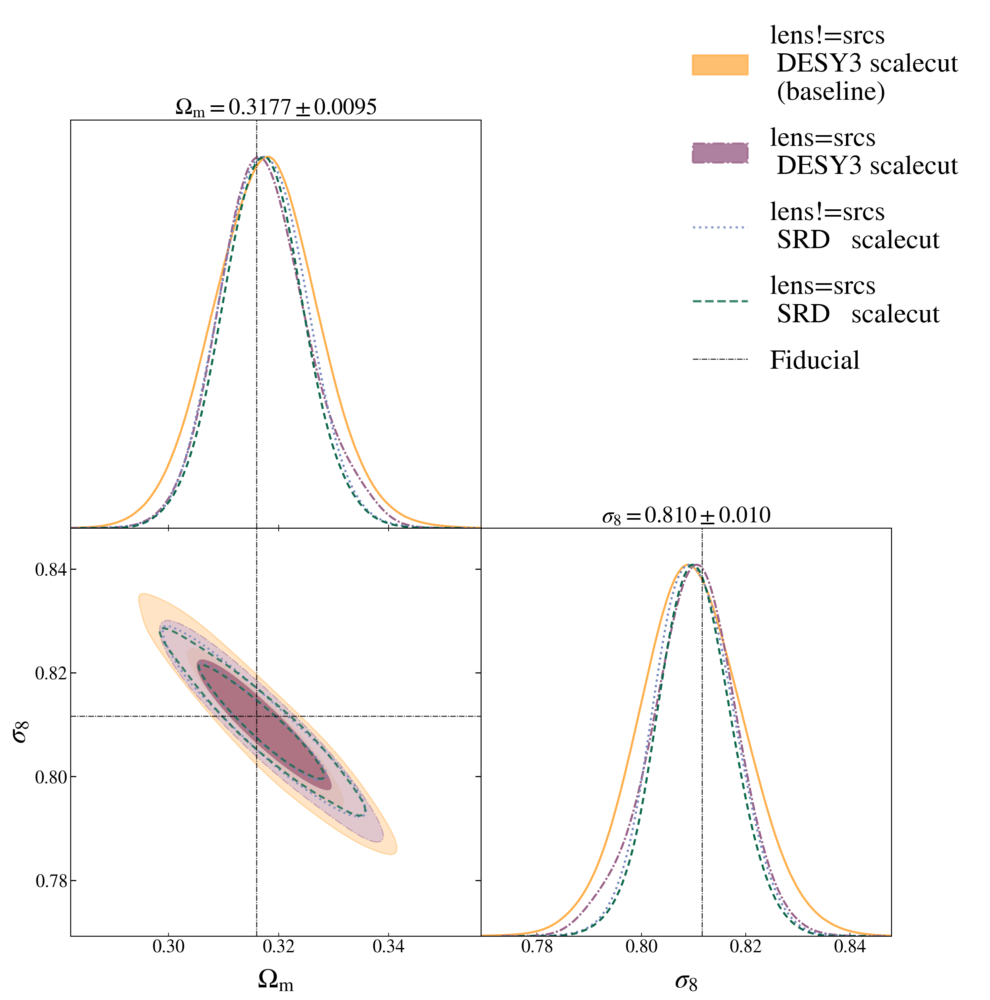

In [35]:
import numpy as np
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from getdist import plots

g = plots.get_subplot_plotter(subplot_size=8)
g.settings.title_limit = 1
g.settings.title_limit_labels = True
g.settings.title_limit_fontsize = 25
g.settings.lab_fontsize = 24
g.settings.legend_fontsize = 30
g.settings.figure_legend_frame = False
g.settings.axes_fontsize = 20
g.settings.axes_labelsize = 30
g.settings.axis_tick_max_labels = 4

#params = ['As_1e9','ns','H0','omegab','omegam','sigma8']
params = ['omegam', 'sigma8']
if 'neutrino' in labels[choice]:
    params.append('mnu')
if 'wcdm' in labels[choice]:
    params.append('w')
cosmo_fid = {p: fiducials[p] for p in params}

g.triangle_plot(
    samples, params=params, filled=True,
    markers=cosmo_fid,
    marker_args={'ls':(0, (5,1,1,1)),'lw':1.2,'color':'k','alpha':0.8},
    legend_labels= labels,
    legend_loc='upper center',
    contour_colors=['#FFAF4C', '#9A6289', '#7386BE','#0F694E'],
    contour_ls = ['-','-.',':','--'],
    contour_args=[{'alpha':0.8}, {'alpha':0.8}, {'alpha':0.8, 'filled':False}, {'alpha':0.8, 'filled':False}],
)

colors = ['#FFAF4C', '#9A6289', '#7386BE', '#0F694E']
linestyles = ['-', '-.', ':', '--']
alphas = [0.8, 0.8, 0.8, 0.8]
filled_flags = [True, True, False, False]

dataset_handles = []
for lab, c, ls, a, is_filled in zip(labels, colors, linestyles, alphas, filled_flags):
    if is_filled:
        h = Patch(facecolor=c, edgecolor=c, linestyle=ls, linewidth=2.0, alpha=a, label=lab)
    else:
        h = Line2D([0], [0], color=c, linestyle=ls, linewidth=2.5, alpha=a, label=lab)
    dataset_handles.append(h)
    
fid_handle = Line2D([0], [0], ls=(0, (5,1,1,1)), lw=1.2, color='k', alpha=0.8, label='Fiducial')

# 移除 getdist 自动 legend（如果存在）
if g.legend is not None:
    g.legend.remove()

g.legend = g.fig.legend(
    handles=dataset_handles + [fid_handle],
    loc='upper right',
    frameon=False,
    fontsize=g.settings.legend_fontsize,
    ncol=1,
)

plt.show()

g.export(f'pic/analysis_choice_contour.png', dpi=300)


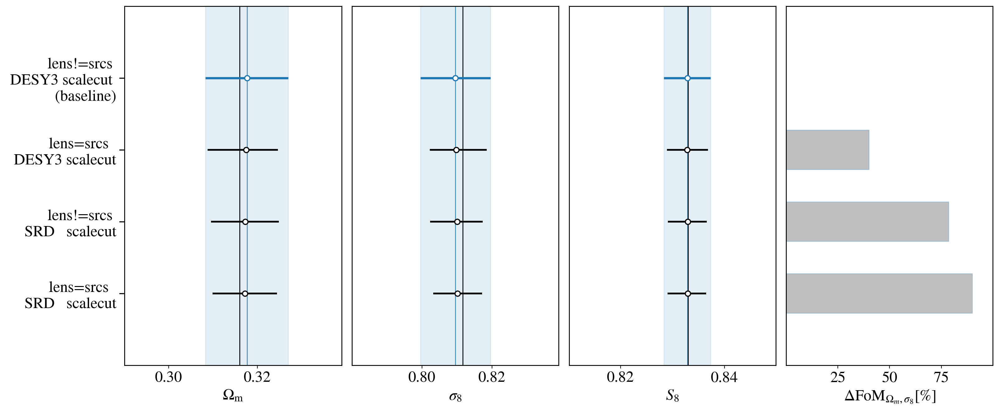

In [31]:
res0 = 0

def plot_row(axs, labels, samples, params, color='C0', ):
    
    assert len(axs)==len(params)+1
    
    assert len(labels)==len(samples)
    
    nparam = len(params)
    ys = np.arange(len(samples))[::-1]
    
    # set the space of baseline, assume the first chain is the baseline
    for i in range(nparam):
        p = params[i]
        stat = samples[0].getMargeStats().parWithName(p)
        mean = stat.mean
        upper_bound = stat.limits[0].upper
        lower_bound = stat.limits[0].lower
        
        axs[i].axvspan(lower_bound, upper_bound, color=color, alpha=0.12, zorder=0)
        axs[i].axvline(mean, color=color, lw=1, alpha=0.8, zorder=0)
        axs[i].axvline(fiducials[p], color='k',lw=1,alpha=1,zorder=0)
        axs[i].set_xlim(mean-3*(mean-lower_bound), mean+3*(upper_bound-mean))
        axs[i].set_ylim(ys[-1]-1, ys[0]+1)
    
    # set the labels of chains
    axs[0].set_yticks(ys)
    axs[0].set_yticklabels(labels)
    
    for i in range(1,len(axs)):
        axs[i].set_yticks(ys)
        axs[i].tick_params(axis='y', left=False)
        axs[i].set_yticklabels([])
        axs[i].set_ylim(ys[-1]-1, ys[0]+1)
        
    # plot the error bar
    for i in range(len(samples)):
        sample = samples[i]
        y = ys[i]
        c = color if i==0 else 'k'
        lw = 2.6 if i==0 else 2.0
        for j in range(len(params)):
            ax = axs[j]
            p = params[j]
            stat = sample.getMargeStats().parWithName(p)
            mean = stat.mean
            upper_bound = stat.limits[0].upper
            lower_bound = stat.limits[0].lower
            
            ax.hlines(y, lower_bound, upper_bound, color=c, lw=lw)
            ax.plot(mean,y,marker='o',mfc='white',mec=c,mew=1.3,ms=6,linestyle='None')
            
            #set x-axis
            if i==0:
                ax.set_xlabel(sample.getParamNames().parWithName(p).latexLabel())

        #now get the estimation of FoM
        p1 = params[0]
        p2 = params[1]
        names = [n.name for n in sample.getParamNames().names]
        a, b = names.index(p1), names.index(p2)
        cov = sample.getCov(pars=[a,b])
        det = np.linalg.det(cov)
        res = np.nan if det <= 0 or not np.isfinite(det) else 1.0 / np.sqrt(det)

        if i==0:
            res0 = res
        else:
            axs[-1].barh(y, (res-res0)/res0*100, height=0.55, alpha=0.25, color=c, edgecolor=color)
        
        #set x-axis for FoM
        if i==0:
            axs[-1].set_xlabel(r'$ \Delta \mathrm{FoM}_{\Omega_m, \sigma_8} [\%]$')
        
    
fig = plt.figure(figsize = (18, 7.5))
gs = fig.add_gridspec(1,4,width_ratios=[1.05, 1.0, 1.0, 1.0],wspace=0.05, hspace=0.2)
axs = [fig.add_subplot(gs[i]) for i in range(4)]

plot_row(axs=axs, labels=labels, samples=samples, color='C0', params=['omegam','sigma8','S8'], )

#finetue the plot settings
axs[-1].set_xlim(0.1, 100-0.1)
from matplotlib.ticker import MultipleLocator, AutoMinorLocator
axs[0].set_xlim(0.2901, 0.34-0.001)
axs[0].xaxis.set_major_locator(MultipleLocator(0.02))
axs[1].set_xlim(0.7801, 0.84-0.001)
axs[1].xaxis.set_major_locator(MultipleLocator(0.02))
axs[2].set_xlim(0.8101, 0.85-0.0001)
axs[2].xaxis.set_major_locator(MultipleLocator(0.02))

fig.savefig('pic/analysis_choice_FoM.png', dpi=300 )

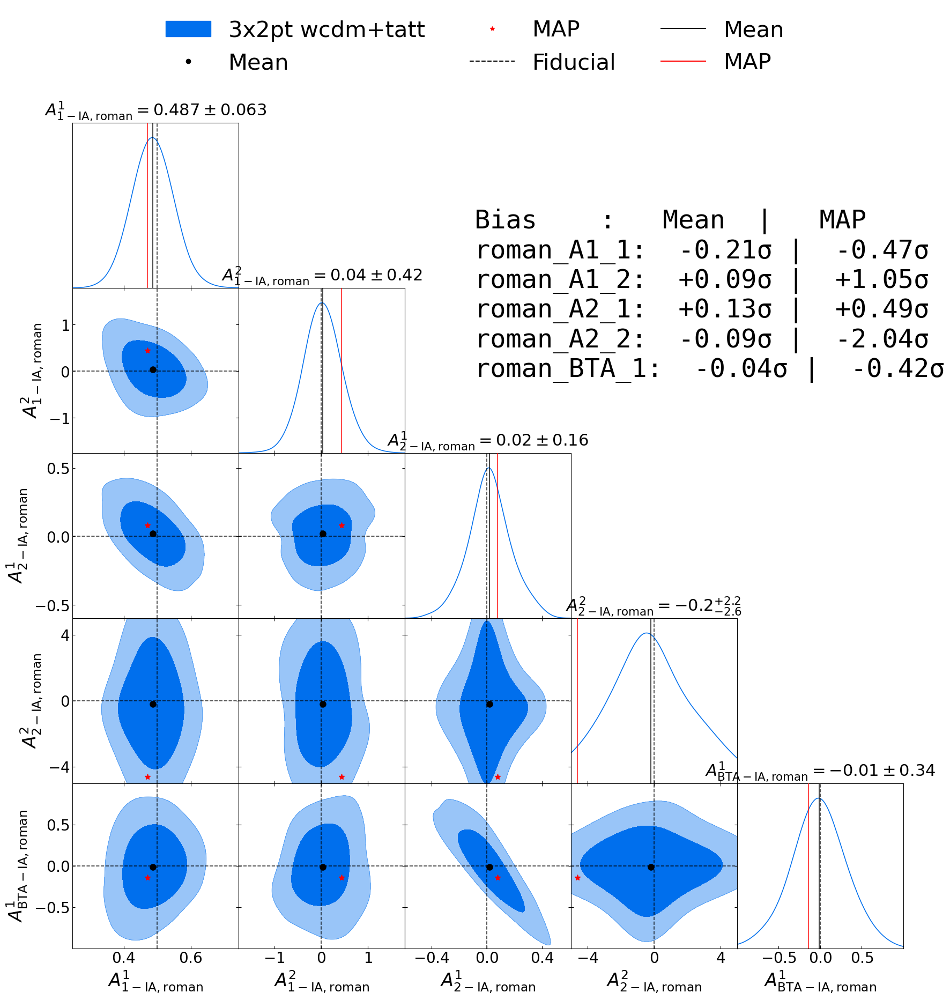

In [ ]:
import numpy as np
from matplotlib.lines import Line2D
from getdist import plots

g = plots.get_subplot_plotter(subplot_size=4)
g.settings.title_limit = 1
g.settings.title_limit_labels = True
g.settings.title_limit_fontsize = 22
g.settings.lab_fontsize = 24
g.settings.legend_fontsize = 30
g.settings.figure_legend_frame = False
g.settings.axes_fontsize = 20
g.settings.axes_labelsize = 24
g.settings.axis_tick_max_labels = 4

params = ['roman_B1_1', 'roman_B1_3', 'roman_B1_5',
          'roman_B1_7', 'roman_B1_9', 'roman_A1_1', 'roman_A1_2']
if 'xi only' in labels[choice]:
    params = ['roman_M1', 'roman_M3', 'roman_M5',
              'roman_DZ_S1', 'roman_DZ_S2', 'roman_DZ_S3', 
              'roman_A1_1', 'roman_A1_2']
if 'tatt' in labels[choice]:
    params = ['roman_A1_1', 'roman_A1_2',
              'roman_A2_1', 'roman_A2_2',
              'roman_BTA_1',]
cosmo_fid = {p: fiducials[p] for p in params}

g.triangle_plot(
    samples, params=params, filled=True,
    markers=cosmo_fid,
    marker_args={'ls':'--','lw':1.2,'color':'k','alpha':0.8},
    legend_labels=[labels[choice]],
    legend_loc='upper center',
)

mean = {p: samples.mean(p) for p in params}
i_map = int(np.argmin(samples.loglikes))
map_pt = {p: samples.samples[i_map, samples.index[p]] for p in params}

for iy, py in enumerate(params):
    for ix, px in enumerate(params[:iy+1]):  # 下三角
        ax = g.subplots[iy, ix]
        if iy!=ix:
            ax.plot(mean[px],   mean[py],   marker='o', ls='None', ms=8, color='k', zorder=10)
            ax.plot(map_pt[px], map_pt[py], marker='*', ls='None', ms=8, color='r', zorder=11)
        if iy==ix:
            ax.axvline(mean[py], color="k", lw=1.2, alpha=0.85, zorder=9)
            ax.axvline(map_pt[py], color="r", lw=1.2, alpha=0.85, zorder=9)

extra_handles = [
    Line2D([0],[0], marker='o', ls='None', color='k', label='Mean'),
    Line2D([0],[0], marker='*', ls='None', color='r', label='MAP'),
    Line2D([0],[0], marker='None', ls='--', color='k', label='Fiducial'),
    Line2D([0],[0], marker='None', ls='-', color='k', label='Mean'),
    Line2D([0],[0], marker='None', ls='-', color='r', label='MAP'),
]
base_handles = g.legend.legend_handles
base_labels  = [t.get_text() for t in g.legend.get_texts()]
g.legend.remove()
all_handles = list(base_handles) + extra_handles
all_labels  = list(base_labels)  + [h.get_label() for h in extra_handles]

g.legend = g.fig.legend(
    all_handles, all_labels,
    loc='upper center',
    frameon=False,
    fontsize=g.settings.legend_fontsize,
    ncol=len(all_labels)/2,
)

lines = ["Bias    :   Mean  |   MAP"]
for p in params:
    std = samples[p].std()
    bias1 = (mean[p] - fiducials[p])/std
    bias2 = (map_pt[p] - fiducials[p])/std
    lines.append(f"{p:>8s}: {bias1:+6.2f}σ | {bias2:+6.2f}σ")
bias_text = "\n".join(lines)

g.fig.text(
    0.5, 0.8, bias_text,
    ha="left", va="top",
    fontsize=35, family="monospace",
    bbox=dict(boxstyle="round,pad=0.4", facecolor="white", edgecolor='white', alpha=0.9),
)

g.export(f'{labels[choice]}_nuisance.png', dpi=300)


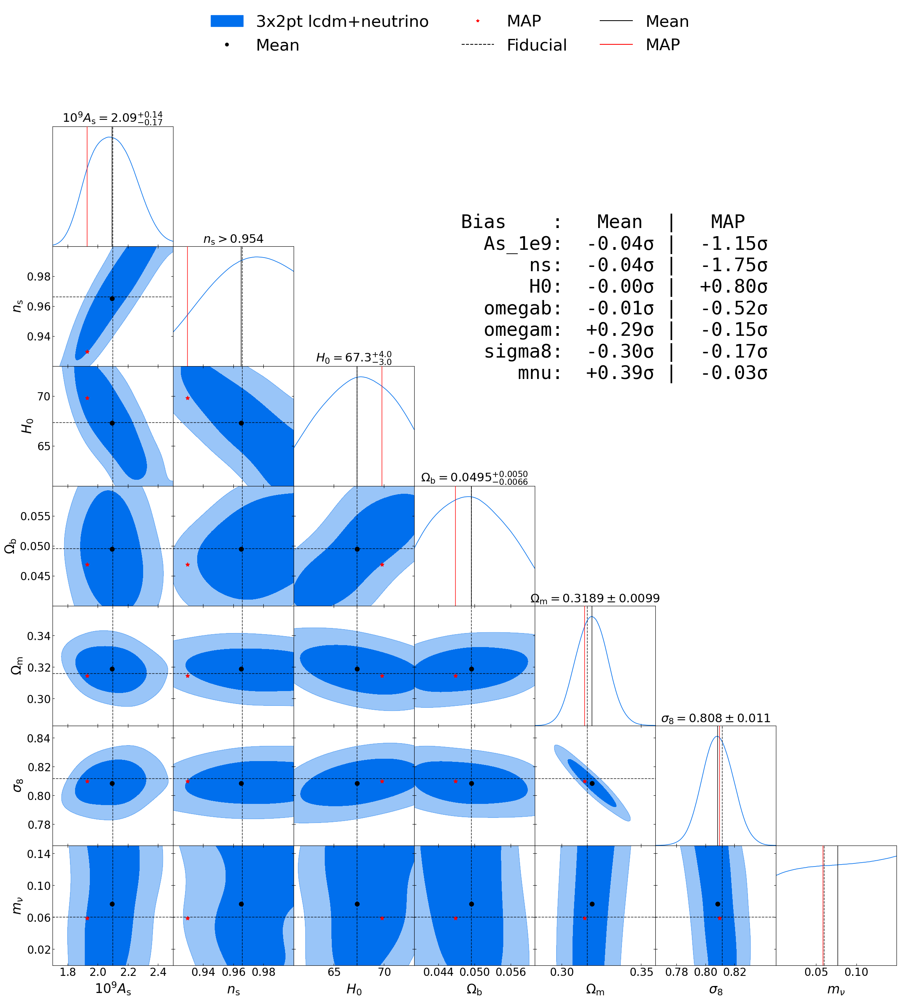

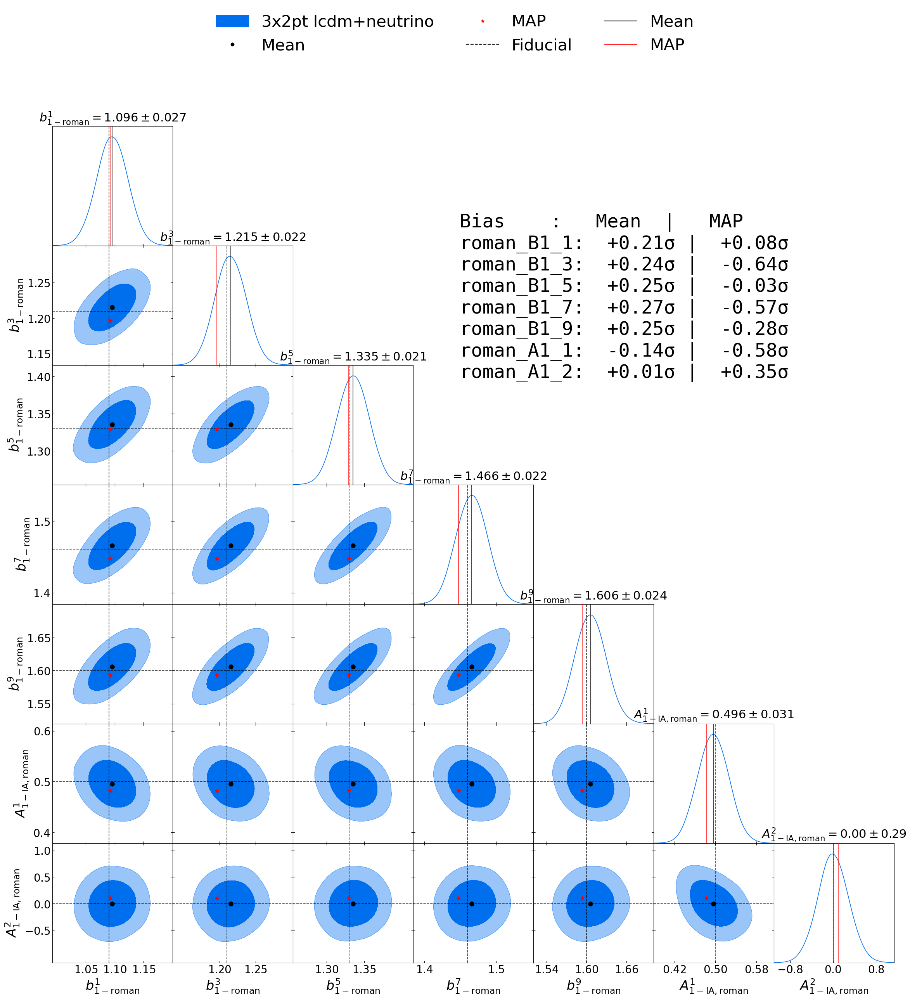

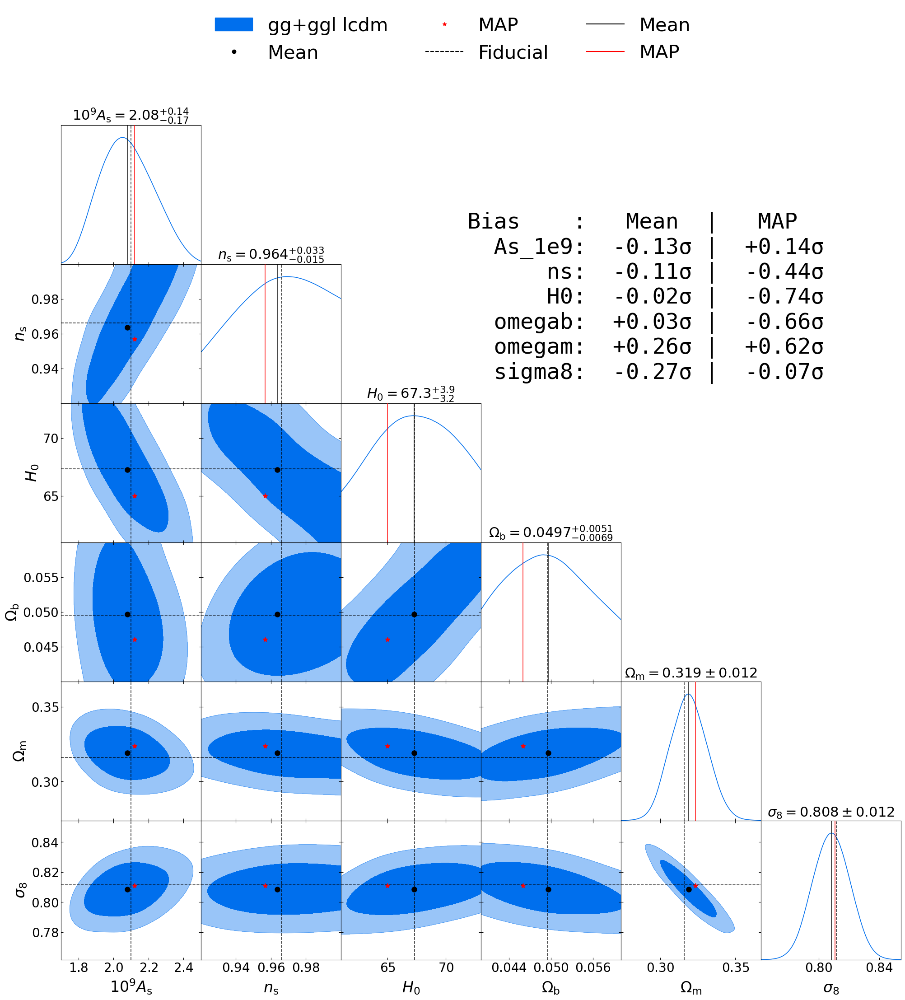

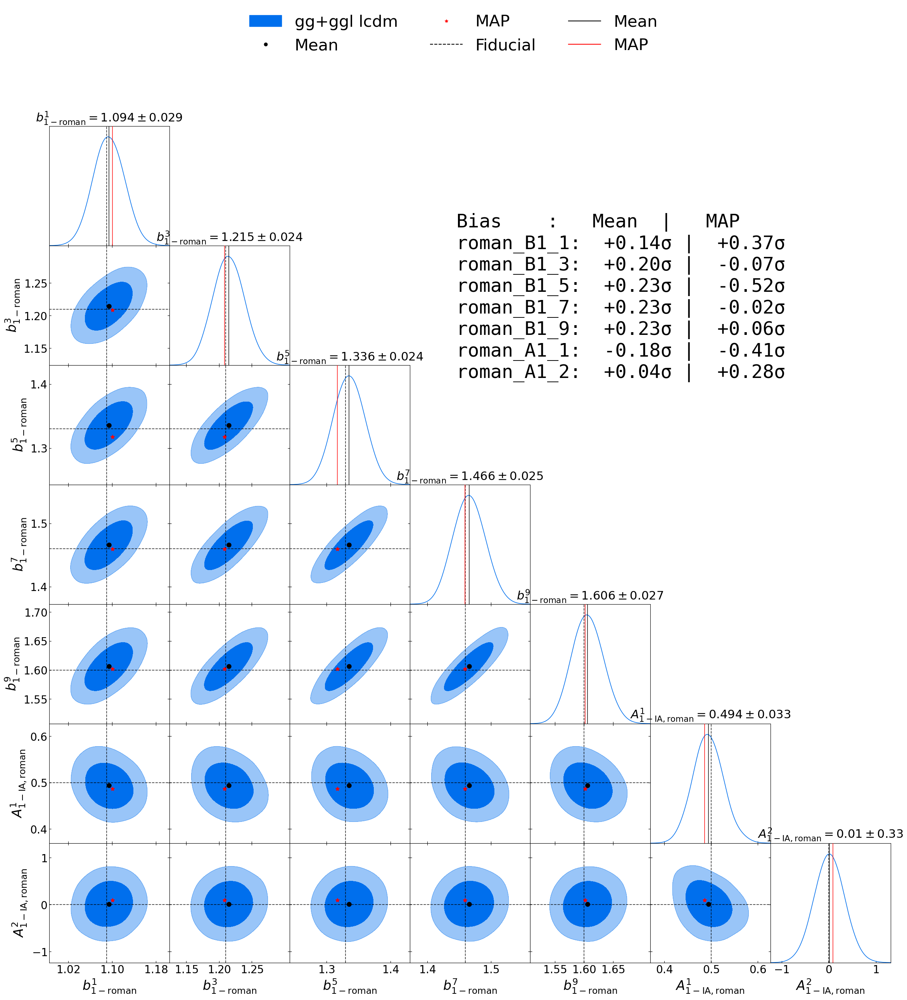

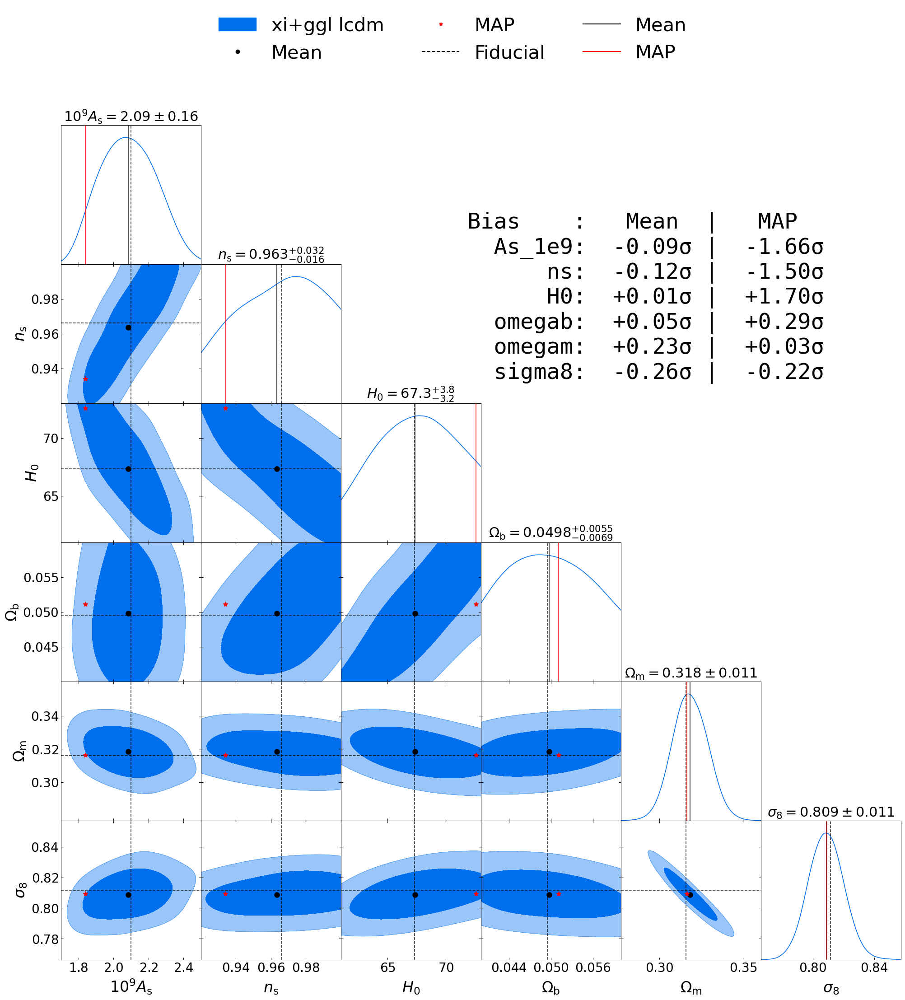

...

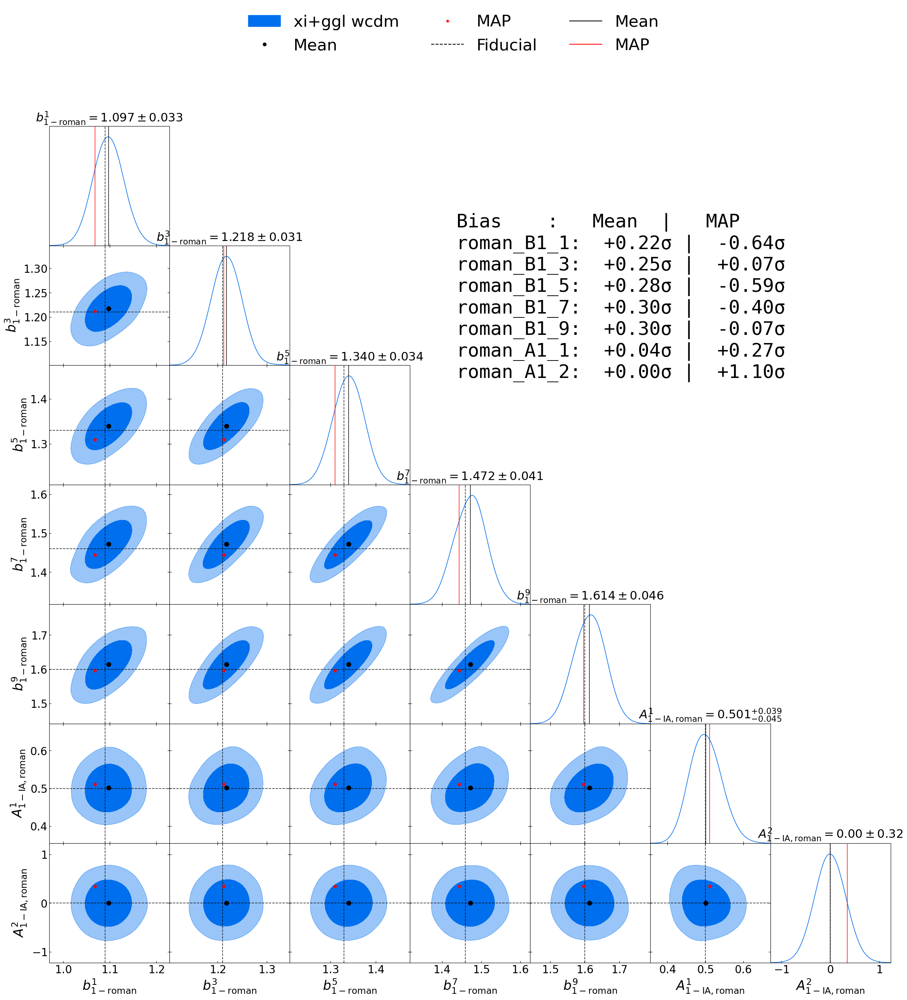

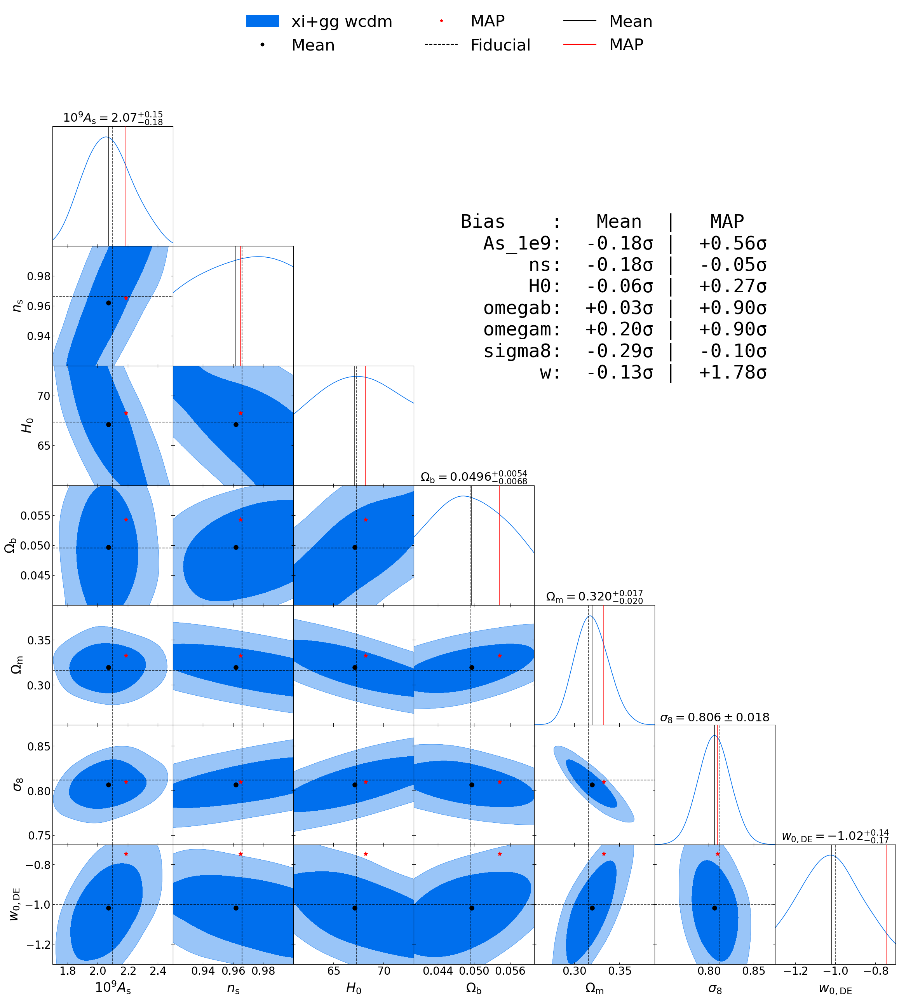

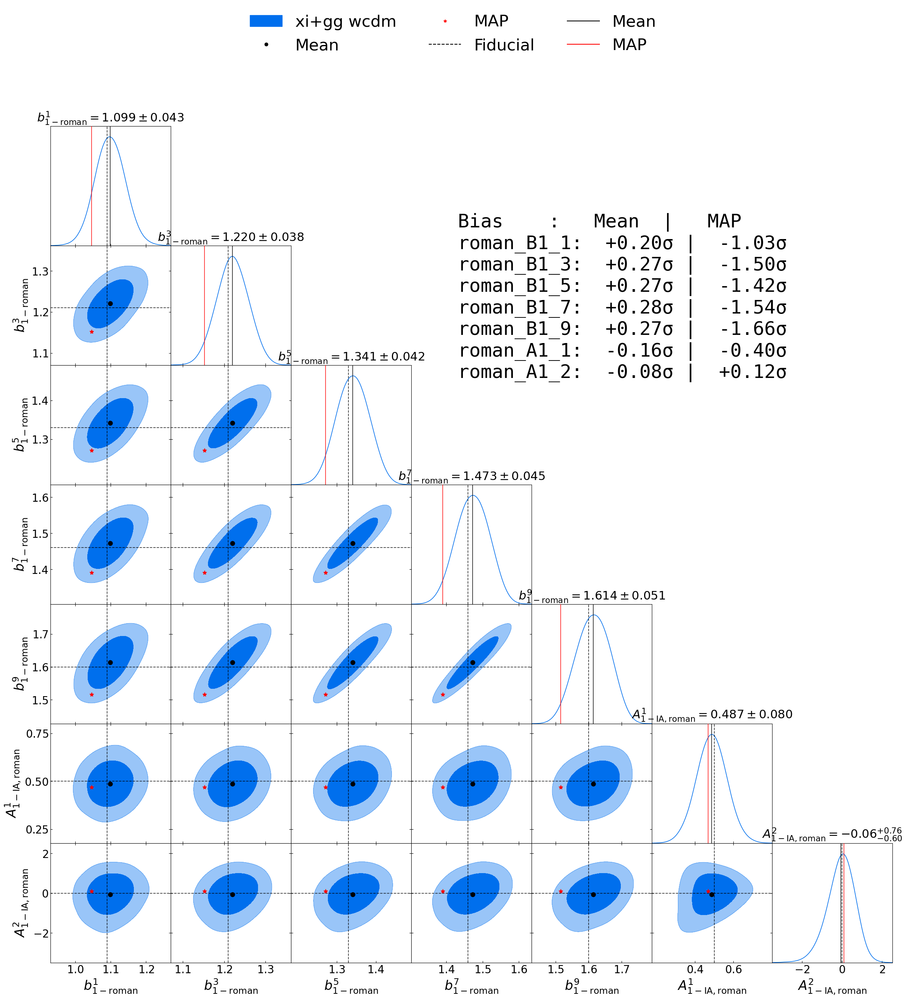

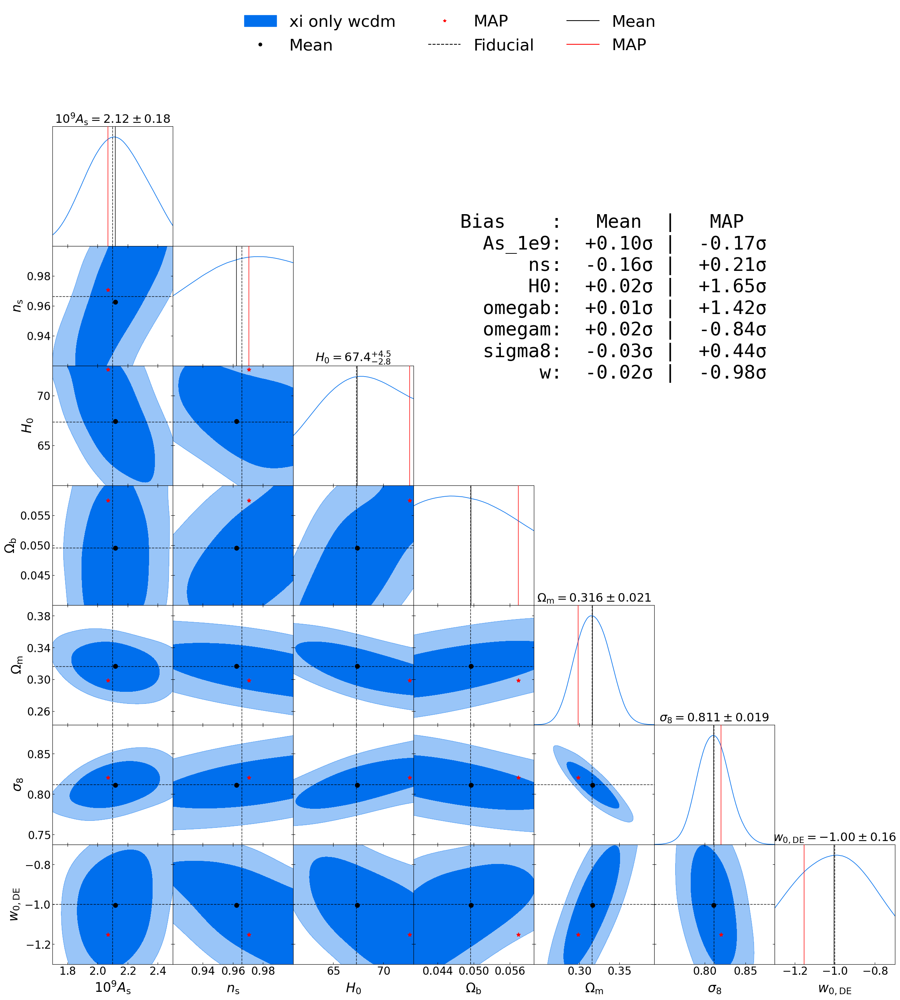

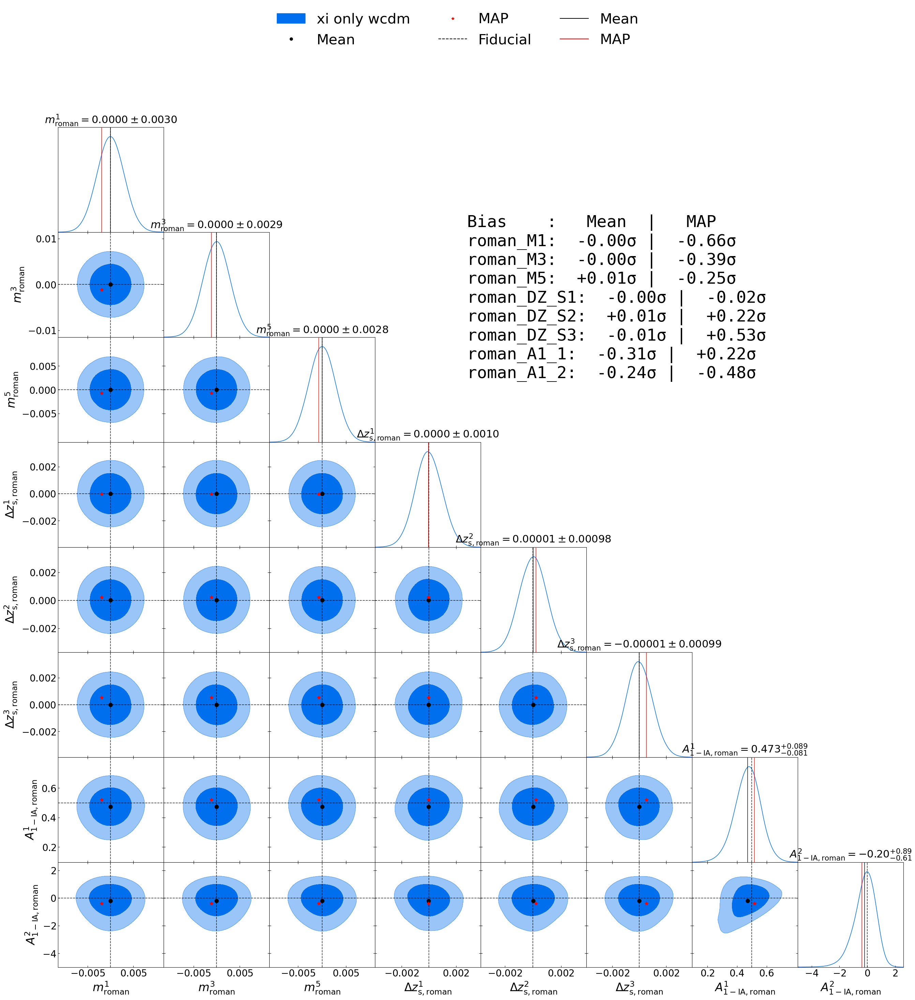

In [ ]:
for choice in range(10):
    
    filepaths = [
        './data/roman_lcdm_neutrino_mcmc/',
        './data/roman_lcdm_2x2pt_mcmc/',
        './data/roman_lcdm_xi_ggl_mcmc/',
        './data/roman_lcdm_xi_gg_mcmc/',
        './data/roman_lcdm_xi_mcmc/',
        './data/roman_wcdm_neutrino_mcmc/',
        './data/roman_wcdm_2x2pt_mcmc/',
        './data/roman_wcdm_xi_ggl_mcmc/',
        './data/roman_wcdm_xi_gg_mcmc/',
        './data/roman_wcdm_xi_mcmc/',
        ]
    labels = ['3x2pt lcdm+neutrino','gg+ggl lcdm', 'xi+ggl lcdm', 'xi+gg lcdm', 'xi only lcdm',
            '3x2pt wcdm+neutrino','gg+ggl wcdm', 'xi+ggl wcdm', 'xi+gg wcdm', 'xi only wcdm']
    def load(filepath, settings):
        samples = loadMCSamples(filepath, settings=settings)
        #samples.thin(50)
        
        #indxs = samples.random_single_samples_indices(max_samples=20000, random_state=0)
        #loglikes = None if samples.loglikes is None else samples.loglikes[indxs]
        #samples.setSamples(samples.samples[indxs], weights=None, loglikes=loglikes)
        
        p = samples.getParams()
        s8 = p.sigma8*(p.omegam/0.3)**0.5
        try:
            samples.addDerived(
                s8,
                'S8',
                label = r'S_8',
            )
        except:
            True
        return samples
    settings = {'ignore_rows':0.3, 'contours': [0.68, 0.95]}
    samples = load(filepaths[choice], settings = settings)
    # clear wrong latex
    pn = samples.getParamNames()
    latex_As = r'10^{9} A_{\rm s}'
    for p in pn.names:
        if p.name == 'mnu':
            p.label = r'm_{\nu}'
        if p.name.lower() == 'omegan':
            p.label = r'\Omega_{\nu}'
        if p.name == 'As_1e9':
            p.label = latex_As
    fiducials ={
        'As_1e9': 2.1,
        'ns': 0.96605,
        'H0': 67.32,
        'omegab': 0.0495,
        'omegam': 0.316,
        'sigma8': 0.81164266,
        'mnu': 0.06,
        'w': -1.0,
        'roman_DZ_S1': 0.0,
        'roman_DZ_S2': 0.0,
        'roman_DZ_S3': 0.0,
        'roman_DZ_S4': 0.0,
        'roman_DZ_S5': 0.0,
        'roman_DZ_S6': 0.0,
        'roman_DZ_S7': 0.0,
        'roman_DZ_S8': 0.0,
        
        'roman_DZ_L1': 0.0,
        'roman_DZ_L2': 0.0,
        'roman_DZ_L3': 0.0,
        'roman_DZ_L4': 0.0,
        'roman_DZ_L5': 0.0,
        'roman_DZ_L6': 0.0,
        'roman_DZ_L7': 0.0,
        'roman_DZ_L8': 0.0,
        'roman_DZ_L9': 0.0,
        'roman_DZ_L10': 0.0,
        
        'roman_M1': 0.0,
        'roman_M2': 0.0,
        'roman_M3': 0.0,
        'roman_M4': 0.0,
        'roman_M5': 0.0,
        'roman_M6': 0.0,
        'roman_M7': 0.0,
        'roman_M8': 0.0,
        
        'roman_A1_1': 0.5,
        'roman_A1_2': 0.0,
        
        'roman_B1_1': 1.09,
        'roman_B1_2': 1.15,
        'roman_B1_3': 1.21,
        'roman_B1_4': 1.27,
        'roman_B1_5': 1.33,
        'roman_B1_6': 1.40,
        'roman_B1_7': 1.46,
        'roman_B1_8': 1.53,
        'roman_B1_9': 1.60,
        'roman_B1_10': 1.67,
    }

    fiducials['S8'] = fiducials['sigma8']*(fiducials['omegam']/0.3)**0.5
    #------------------------plot cosmo-------------------------------#
    import numpy as np
    from matplotlib.lines import Line2D
    from getdist import plots

    g = plots.get_subplot_plotter(subplot_size=4)
    g.settings.title_limit = 1
    g.settings.title_limit_labels = True
    g.settings.title_limit_fontsize = 22
    g.settings.lab_fontsize = 24
    g.settings.legend_fontsize = 30
    g.settings.figure_legend_frame = False
    g.settings.axes_fontsize = 20
    g.settings.axes_labelsize = 24
    g.settings.axis_tick_max_labels = 4

    params = ['As_1e9','ns','H0','omegab','omegam','sigma8']
    if choice==0 or choice==5:
        params = ['As_1e9','ns','H0','omegab','omegam','sigma8','mnu']
    if choice>=5:
        params.append('w')
    cosmo_fid = {p: fiducials[p] for p in params}

    g.triangle_plot(
        samples, params=params, filled=True,
        markers=cosmo_fid,
        marker_args={'ls':'--','lw':1.2,'color':'k','alpha':0.8},
        legend_labels=[labels[choice]],
        legend_loc='upper center',
    )

    mean = {p: samples.mean(p) for p in params}
    i_map = int(np.argmin(samples.loglikes))
    map_pt = {p: samples.samples[i_map, samples.index[p]] for p in params}

    for iy, py in enumerate(params):
        for ix, px in enumerate(params[:iy+1]):  # 下三角
            ax = g.subplots[iy, ix]
            if iy!=ix:
                ax.plot(mean[px],   mean[py],   marker='o', ls='None', ms=8, color='k', zorder=10)
                ax.plot(map_pt[px], map_pt[py], marker='*', ls='None', ms=8, color='r', zorder=11)
            if iy==ix:
                ax.axvline(mean[py], color="k", lw=1.2, alpha=0.85, zorder=9)
                ax.axvline(map_pt[py], color="r", lw=1.2, alpha=0.85, zorder=9)

    extra_handles = [
        Line2D([0],[0], marker='o', ls='None', color='k', label='Mean'),
        Line2D([0],[0], marker='*', ls='None', color='r', label='MAP'),
        Line2D([0],[0], marker='None', ls='--', color='k', label='Fiducial'),
        Line2D([0],[0], marker='None', ls='-', color='k', label='Mean'),
        Line2D([0],[0], marker='None', ls='-', color='r', label='MAP'),
    ]
    base_handles = g.legend.legend_handles
    base_labels  = [t.get_text() for t in g.legend.get_texts()]
    g.legend.remove()
    all_handles = list(base_handles) + extra_handles
    all_labels  = list(base_labels)  + [h.get_label() for h in extra_handles]

    g.legend = g.fig.legend(
        all_handles, all_labels,
        loc='upper center',
        frameon=False,
        fontsize=g.settings.legend_fontsize,
        ncol=len(all_labels)/2,
    )

    lines = ["Bias    :   Mean  |   MAP"]
    for p in params:
        std = samples[p].std()
        bias1 = (mean[p] - fiducials[p])/std
        bias2 = (map_pt[p] - fiducials[p])/std
        lines.append(f"{p:>8s}: {bias1:+6.2f}σ | {bias2:+6.2f}σ")
    bias_text = "\n".join(lines)

    # 方案A：直接按 figure 坐标放到右上角（最稳，不会被裁剪）
    g.fig.text(
        0.5, 0.8, bias_text,  # (x,y) 是 figure fraction，按需要微调
        ha="left", va="top",
        fontsize=35, family="monospace",
        bbox=dict(boxstyle="round,pad=0.4", facecolor="white", edgecolor='white', alpha=0.9),
    )

    g.export(f'{labels[choice]}_cosmo.png', dpi=300)
    #---------------------plot nuisance--------------------------#
    import numpy as np
    from matplotlib.lines import Line2D
    from getdist import plots

    g = plots.get_subplot_plotter(subplot_size=4)
    g.settings.title_limit = 1
    g.settings.title_limit_labels = True
    g.settings.title_limit_fontsize = 22
    g.settings.lab_fontsize = 24
    g.settings.legend_fontsize = 30
    g.settings.figure_legend_frame = False
    g.settings.axes_fontsize = 20
    g.settings.axes_labelsize = 24
    g.settings.axis_tick_max_labels = 4

    params = ['roman_B1_1', 'roman_B1_3', 'roman_B1_5',
            'roman_B1_7', 'roman_B1_9', 'roman_A1_1', 'roman_A1_2']
    if choice==4 or choice==9:
        params = ['roman_M1', 'roman_M3', 'roman_M5',
                'roman_DZ_S1', 'roman_DZ_S2', 'roman_DZ_S3', 
                'roman_A1_1', 'roman_A1_2']
    cosmo_fid = {p: fiducials[p] for p in params}

    g.triangle_plot(
        samples, params=params, filled=True,
        markers=cosmo_fid,
        marker_args={'ls':'--','lw':1.2,'color':'k','alpha':0.8},
        legend_labels=[labels[choice]],
        legend_loc='upper center',
    )

    mean = {p: samples.mean(p) for p in params}
    i_map = int(np.argmin(samples.loglikes))
    map_pt = {p: samples.samples[i_map, samples.index[p]] for p in params}

    for iy, py in enumerate(params):
        for ix, px in enumerate(params[:iy+1]):  # 下三角
            ax = g.subplots[iy, ix]
            if iy!=ix:
                ax.plot(mean[px],   mean[py],   marker='o', ls='None', ms=8, color='k', zorder=10)
                ax.plot(map_pt[px], map_pt[py], marker='*', ls='None', ms=8, color='r', zorder=11)
            if iy==ix:
                ax.axvline(mean[py], color="k", lw=1.2, alpha=0.85, zorder=9)
                ax.axvline(map_pt[py], color="r", lw=1.2, alpha=0.85, zorder=9)

    extra_handles = [
        Line2D([0],[0], marker='o', ls='None', color='k', label='Mean'),
        Line2D([0],[0], marker='*', ls='None', color='r', label='MAP'),
        Line2D([0],[0], marker='None', ls='--', color='k', label='Fiducial'),
        Line2D([0],[0], marker='None', ls='-', color='k', label='Mean'),
        Line2D([0],[0], marker='None', ls='-', color='r', label='MAP'),
    ]
    base_handles = g.legend.legend_handles
    base_labels  = [t.get_text() for t in g.legend.get_texts()]
    g.legend.remove()
    all_handles = list(base_handles) + extra_handles
    all_labels  = list(base_labels)  + [h.get_label() for h in extra_handles]

    g.legend = g.fig.legend(
        all_handles, all_labels,
        loc='upper center',
        frameon=False,
        fontsize=g.settings.legend_fontsize,
        ncol=len(all_labels)/2,
    )

    lines = ["Bias    :   Mean  |   MAP"]
    for p in params:
        std = samples[p].std()
        bias1 = (mean[p] - fiducials[p])/std
        bias2 = (map_pt[p] - fiducials[p])/std
        lines.append(f"{p:>8s}: {bias1:+6.2f}σ | {bias2:+6.2f}σ")
    bias_text = "\n".join(lines)

    g.fig.text(
        0.5, 0.8, bias_text,
        ha="left", va="top",
        fontsize=35, family="monospace",
        bbox=dict(boxstyle="round,pad=0.4", facecolor="white", edgecolor='white', alpha=0.9),
    )

    g.export(f'{labels[choice]}_nuisance.png', dpi=300)




In [ ]:
def twocontours(samples:list, fiducials:dict={}, v1:str='omegam', v2:str='S8'):
    '''
    plot omegam-S8 omega-sigma8 countours with fiducial value and deviation\
        estimation if fiducials exist
        
    support maximum 3 samples to plot together
    '''
    #check if variable has fiducial value
    for v in [v1,v2]:
        if v not in fiducials:
            warnings.warn(f'no fiducial value for {v}')
            
    g = plots.get_single_plotter(width_inch=6)
    g.settings.tight_layout = False
    g.settings.legend_frac_subplot_margin = 0.05
    g.plot_2d(samples,
                param1 = v1,
                param2 = v2,
                filled=False,
                nx=1,
                legend_labels=['68%','68%','68%',],
                legend_ncol=3,
                colors=['r', 'g', 'b'],
                alphas=[1.0, 0.8, 0.6],
            )

    fig = plt.gcf()
    axes = fig.get_axes()
    ax = axes[0]
    ymin, ymax = ax.get_ylim()
    xmin, xmax = ax.get_xlim()
    
    #plot fiducial values
    fiducial1 = fiducials[v1]
    ax.axvline(x=fiducial1,linestyle='--',color='k')
    fiducial2 = fiducials[v2]
    ax.axhline(y=fiducial2,linestyle='--',color='k')
    ax.scatter(x=fiducial1,y=fiducial2,marker='o',color='k')
    
    mean_params = []
    for s, color in zip(samples, ['r','g','b']):
        mean_param1 = s.mean(v1)
        mean_param2 = s.mean(v2)
        ax.plot(mean_param1, mean_param2, marker='o', color=color, markersize=2, label=f'Center {color}')
        
        mean_params.append([mean_param1, mean_param2])

    mean_params = np.array(mean_params)

    #--------------calculate the chi2 and significance--------------------#
    chi2s = []
    for index,sample in enumerate(samples):
        cov_mat = sample.cov()
        i = sample.index[v1]
        j = sample.index[v2]
        cov = np.array([[cov_mat[i,i], cov_mat[i,j]],[cov_mat[i,j], cov_mat[j,j]]])

        chi2 = (np.array([fiducial1,fiducial2]) - mean_params[index])@sp.linalg.inv(cov)@(np.array([fiducial1,fiducial2]) - mean_params[index])
        chi2s.append(chi2)
        
        def nsigma2d(chi2):
            return np.sqrt(2)*sp.special.erfinv(1-np.exp(-1/2*chi2))

    #-----------plot and mark the significance----------------#
    from matplotlib.patches import FancyArrowPatch

    xratio = 0.8
    xs = [xmin + (xmax-xmin)*xratio for i in range(len(samples))]
    yratio = [0.95]
    ys = [ymin + (ymax-ymin)*yratio[i] for i in range(len(samples))]
    dx = (xmax-xmin)*0.05
    dy = 0


    colors = ['r','g','b']
    for i in range(len(samples)):
        ax.plot(xs[i], ys[i], marker='o', color='k', markersize=2)
        ax.plot(xs[i]+dx, ys[i], marker='o', color=colors[i], markersize=2)
        arrow = FancyArrowPatch(posA=(xs[i], ys[i]),
                                posB=(xs[i]+dx, ys[i]),
                                linewidth=0.1,
                                mutation_scale=5,
                                color='k')
        ax.add_patch(arrow)
        ax.text(xs[i]+dx/2, ys[i], rf'$ {nsigma2d(chi2s[i]):.4f}\sigma $', ha='center', va='bottom', fontsize=10)
    plt.show()
    plt.savefig(f'twocontour_{v1}_{v2}.png', dpi=400)
    return ax,fig


ax,fig = twocontours(samples=[samples], fiducials=fiducials, v1='omegam', v2='S8')

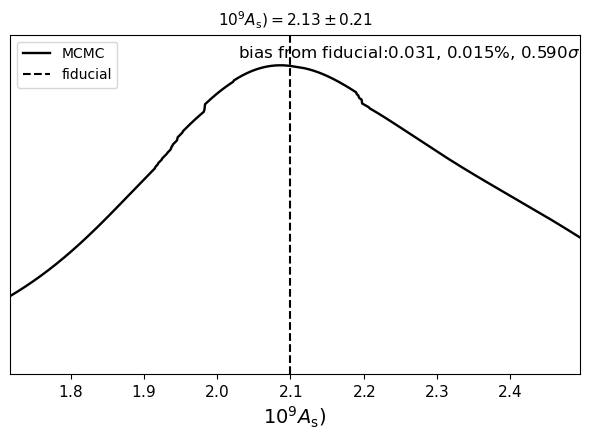

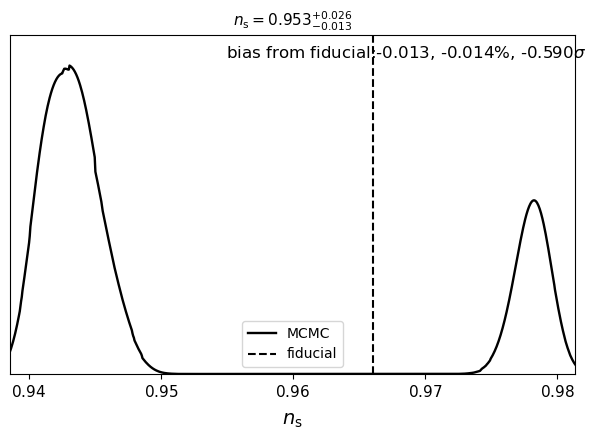

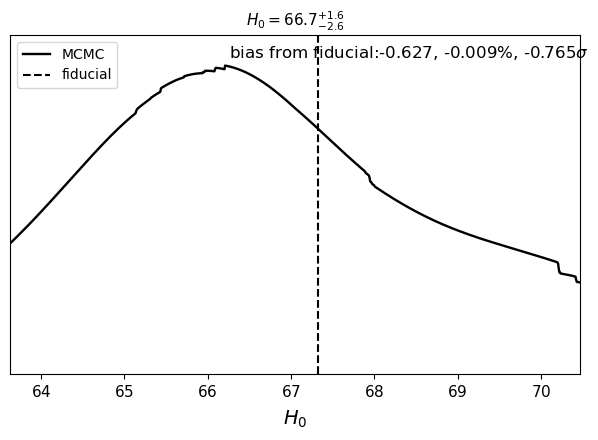

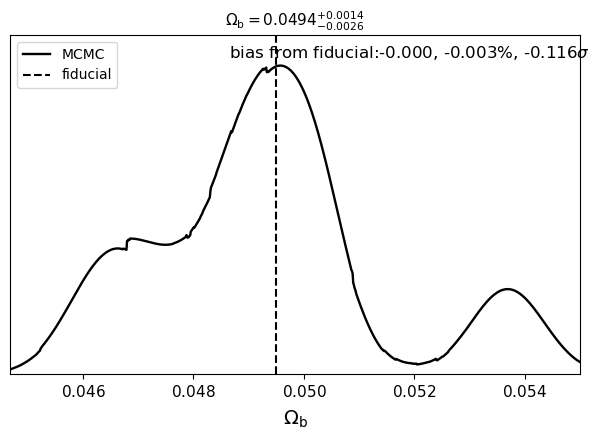

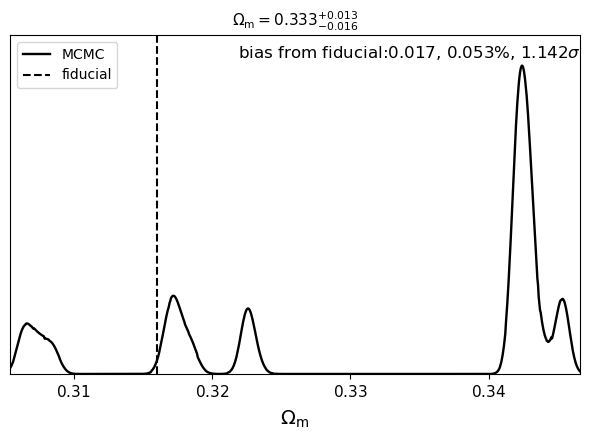

/home/junzhou/ipykernel_1553047/3712592595.py:30: RuntimeWarning: divide by zero encountered in scalar divide
  bias_per = bias/fiducials[name]


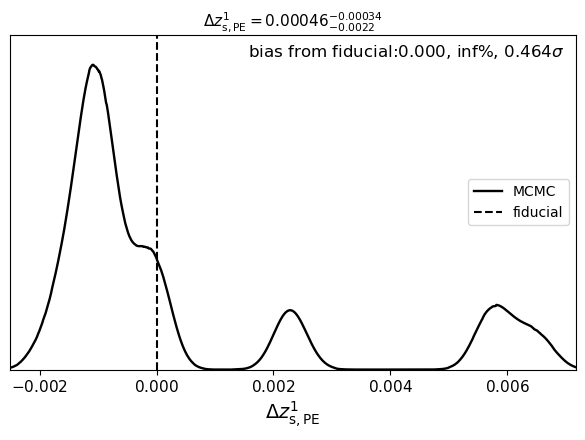

/home/junzhou/ipykernel_1553047/3712592595.py:30: RuntimeWarning: divide by zero encountered in scalar divide
  bias_per = bias/fiducials[name]


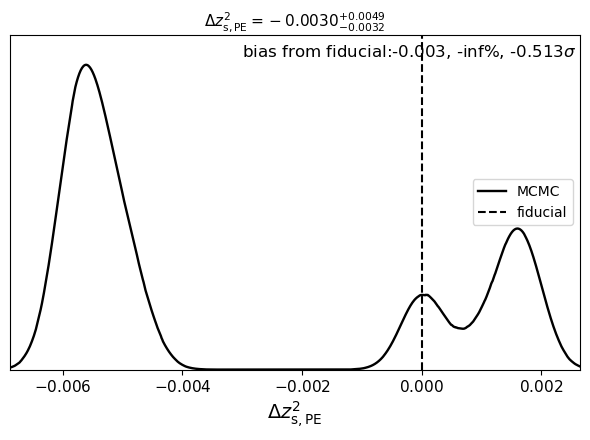

/home/junzhou/ipykernel_1553047/3712592595.py:30: RuntimeWarning: divide by zero encountered in scalar divide
  bias_per = bias/fiducials[name]


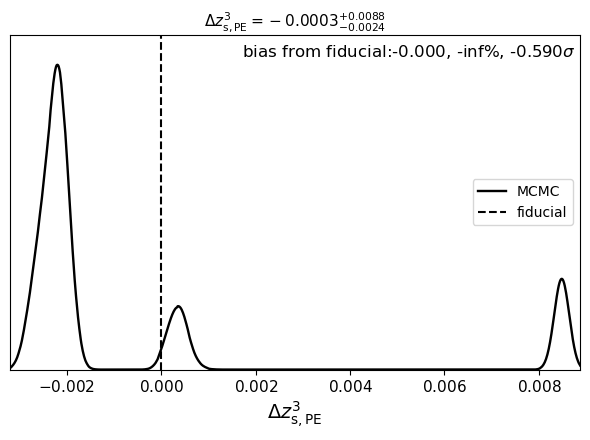

/home/junzhou/ipykernel_1553047/3712592595.py:30: RuntimeWarning: divide by zero encountered in scalar divide
  bias_per = bias/fiducials[name]


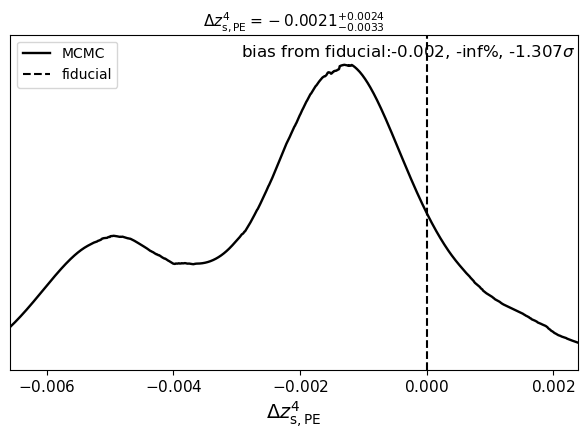

/home/junzhou/ipykernel_1553047/3712592595.py:30: RuntimeWarning: divide by zero encountered in scalar divide
  bias_per = bias/fiducials[name]


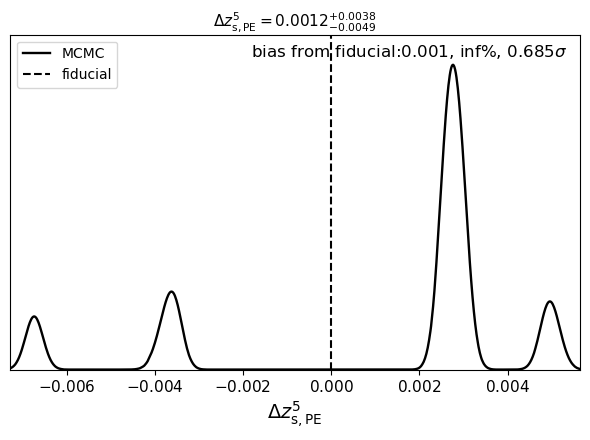

/home/junzhou/ipykernel_1553047/3712592595.py:30: RuntimeWarning: divide by zero encountered in scalar divide
  bias_per = bias/fiducials[name]


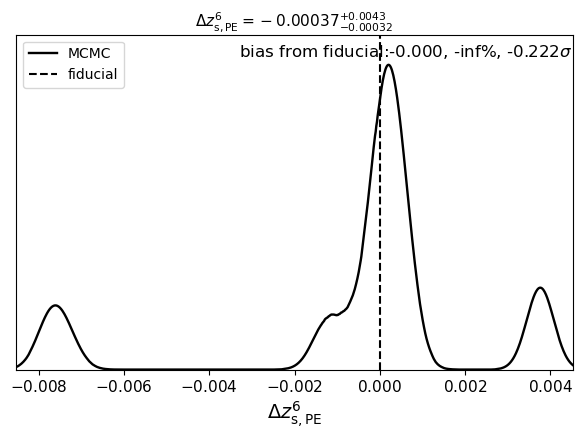

/home/junzhou/ipykernel_1553047/3712592595.py:30: RuntimeWarning: divide by zero encountered in scalar divide
  bias_per = bias/fiducials[name]


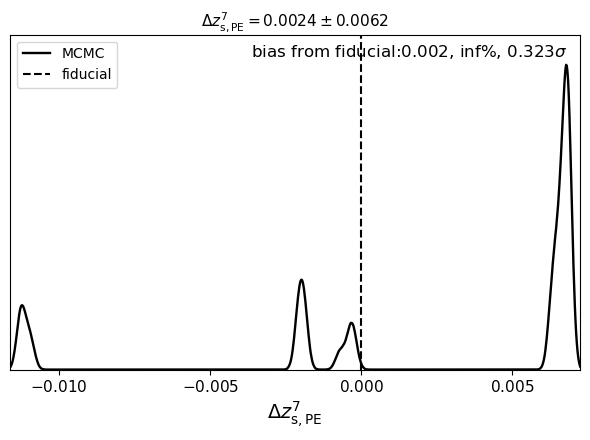

/home/junzhou/ipykernel_1553047/3712592595.py:30: RuntimeWarning: divide by zero encountered in scalar divide
  bias_per = bias/fiducials[name]


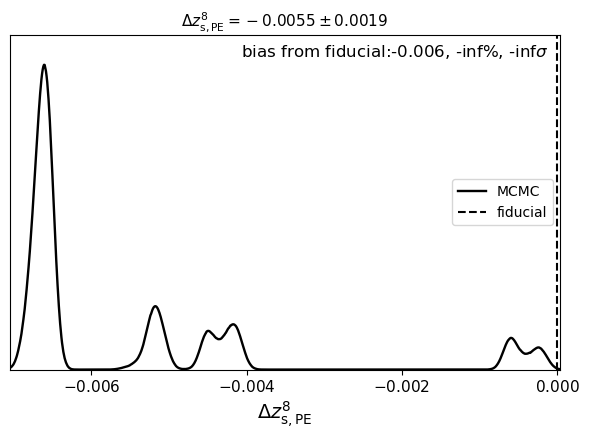

/home/junzhou/ipykernel_1553047/3712592595.py:30: RuntimeWarning: divide by zero encountered in scalar divide
  bias_per = bias/fiducials[name]


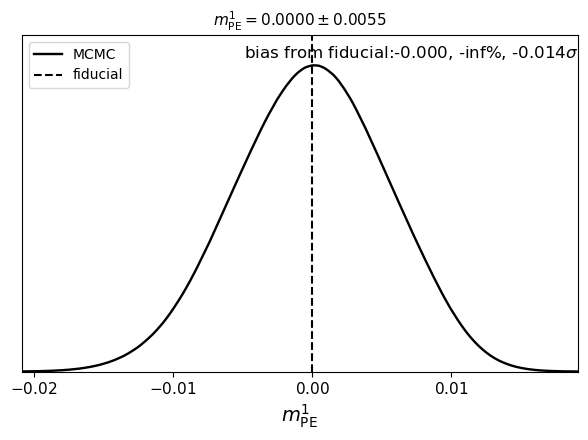

/home/junzhou/ipykernel_1553047/3712592595.py:30: RuntimeWarning: divide by zero encountered in scalar divide
  bias_per = bias/fiducials[name]


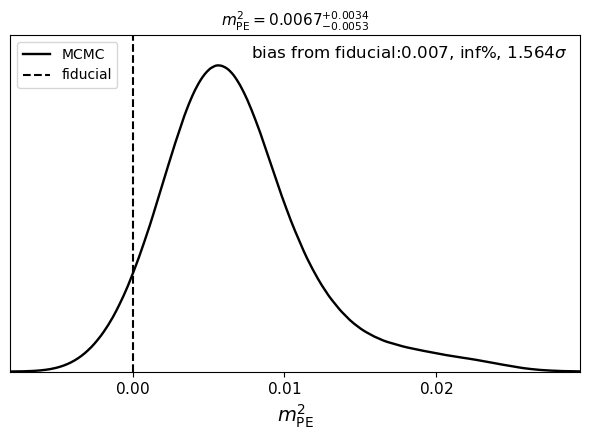

/home/junzhou/ipykernel_1553047/3712592595.py:30: RuntimeWarning: divide by zero encountered in scalar divide
  bias_per = bias/fiducials[name]


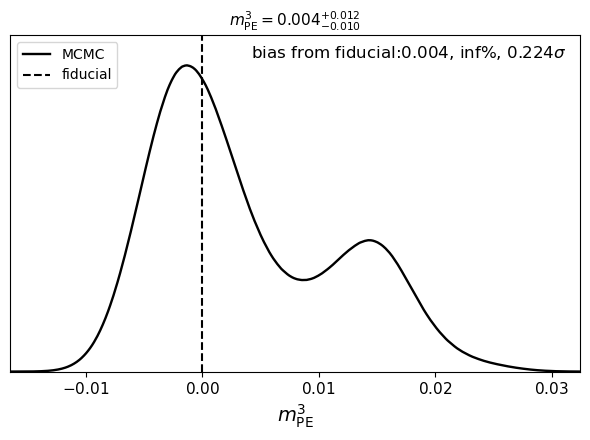

/home/junzhou/ipykernel_1553047/3712592595.py:30: RuntimeWarning: divide by zero encountered in scalar divide
  bias_per = bias/fiducials[name]


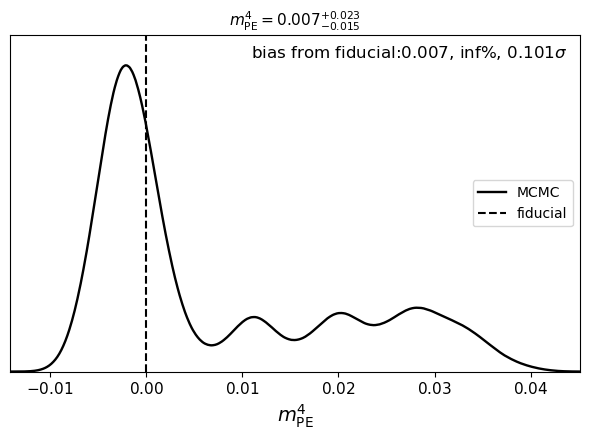

/home/junzhou/ipykernel_1553047/3712592595.py:30: RuntimeWarning: divide by zero encountered in scalar divide
  bias_per = bias/fiducials[name]


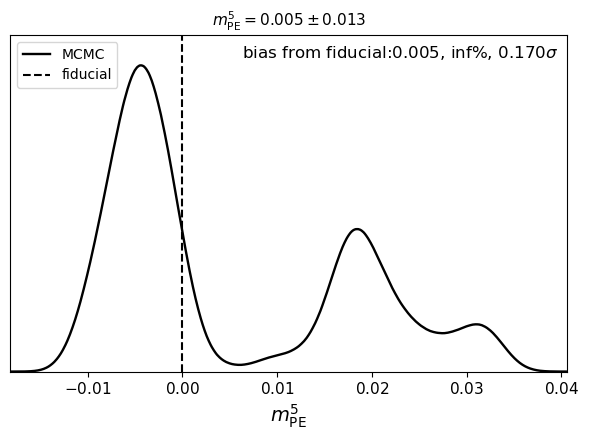

/home/junzhou/ipykernel_1553047/3712592595.py:30: RuntimeWarning: divide by zero encountered in scalar divide
  bias_per = bias/fiducials[name]


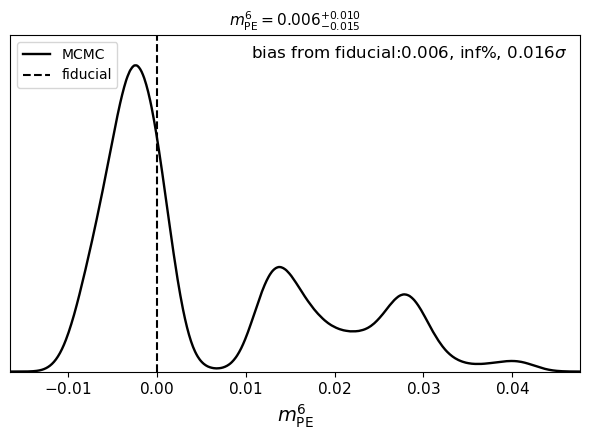

/home/junzhou/ipykernel_1553047/3712592595.py:30: RuntimeWarning: divide by zero encountered in scalar divide
  bias_per = bias/fiducials[name]


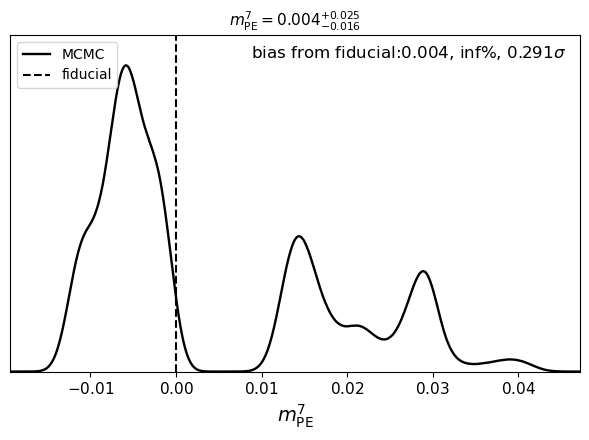

/home/junzhou/ipykernel_1553047/3712592595.py:30: RuntimeWarning: divide by zero encountered in scalar divide
  bias_per = bias/fiducials[name]


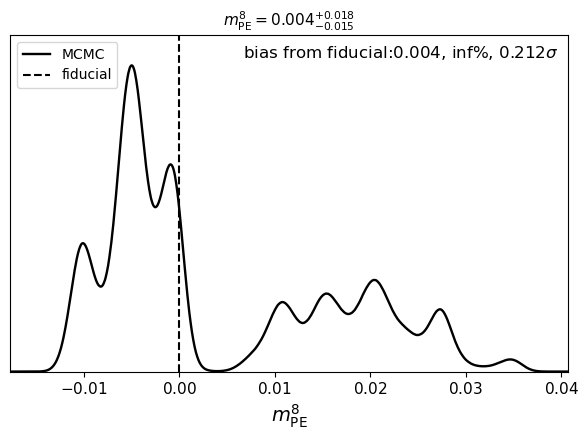

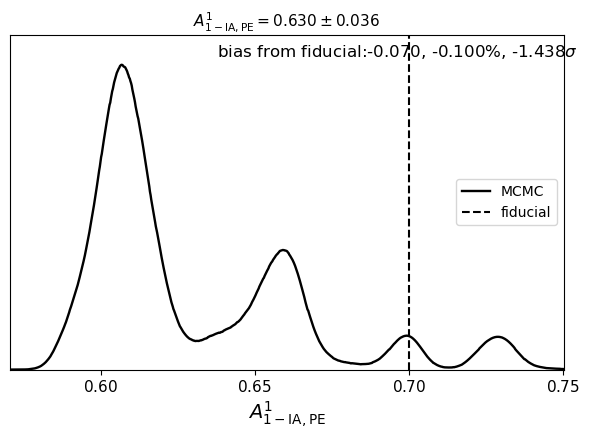

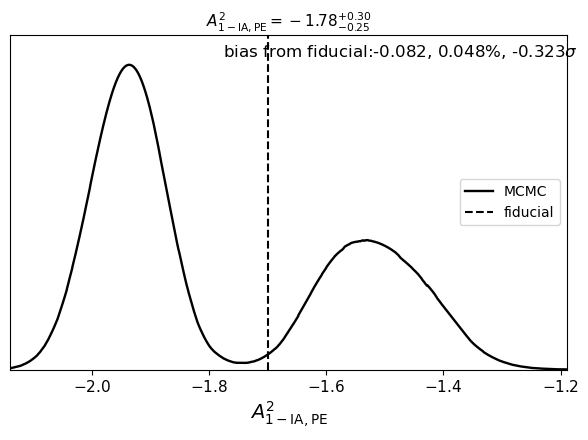

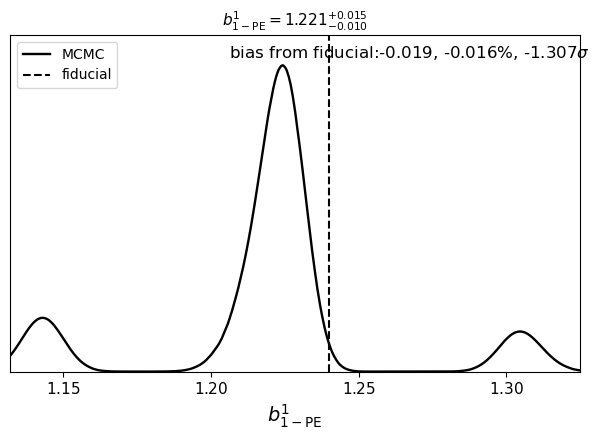

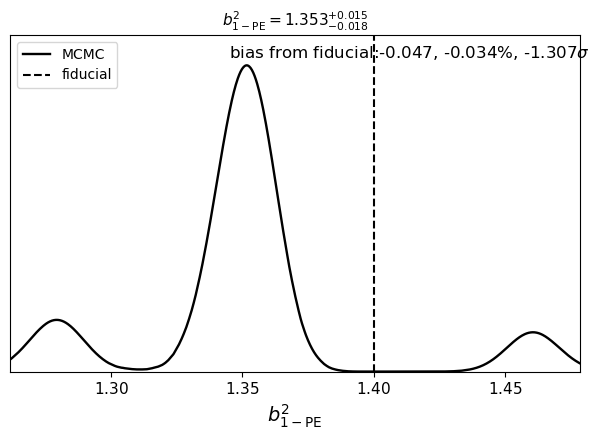

...

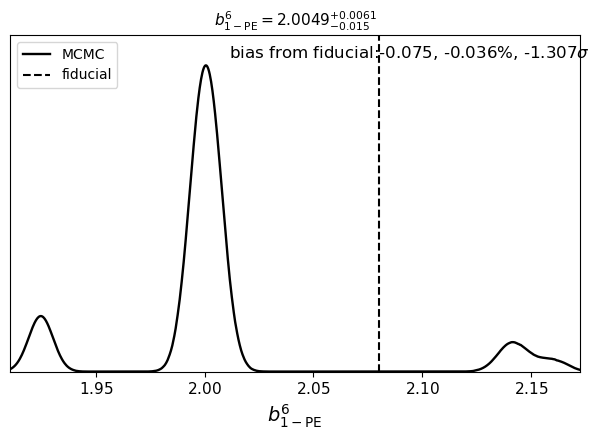

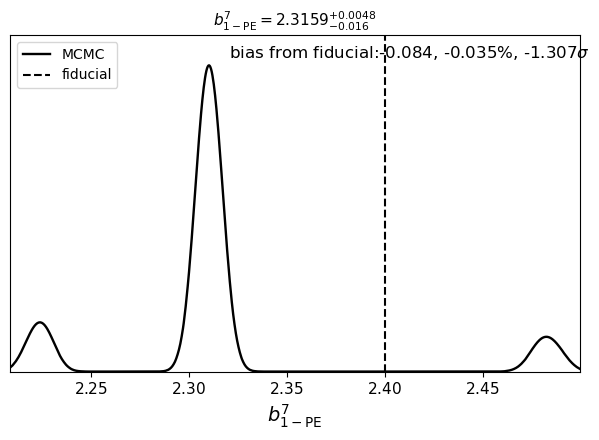

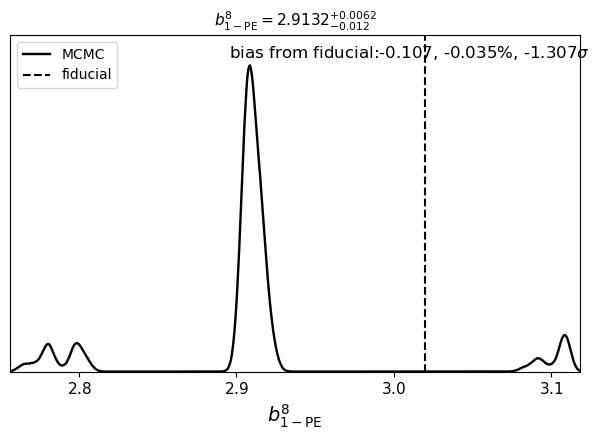

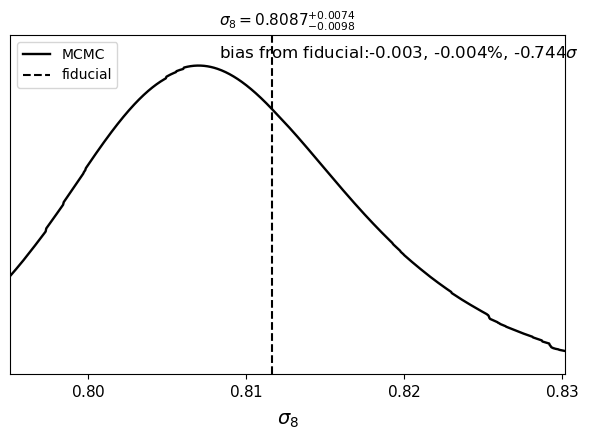

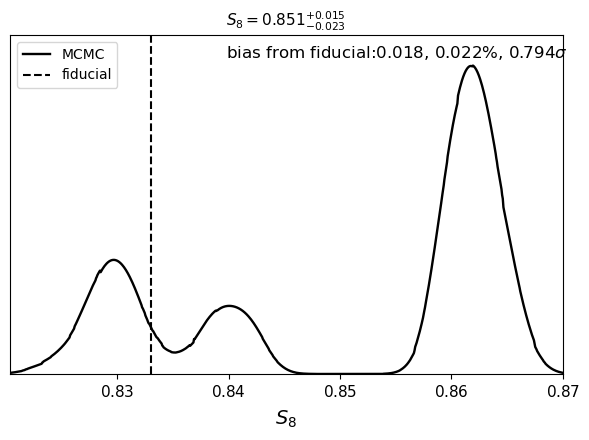

In [ ]:
#g = plots.get_single_plotter(width_inch=6)
for p in samples.getParamNames().names:
    if p.name in fiducials:
        name = p.name
        mean = samples.mean(name)
        g = plots.get_single_plotter(width_inch=6)
        g.plot_1d(samples, name, title_limit=1)
        fig = plt.gcf()
        axes = fig.get_axes()
        ax = axes[0]
        ymin, ymax = ax.get_ylim()
        xmin, xmax = ax.get_xlim()
        
        ax.axvline(x = fiducials[name], ymin=0, ymax=1, linestyle='--', color='k')
        ax.legend(['MCMC', 'fiducial'])
        #----------------------------------
        x = getattr(samples.getParams(), name)
        w = samples.weights
        order = np.argsort(x)
        x_sorted = x[order]
        w_sorted = w[order]
        wcum = np.cumsum(w_sorted)
        wcum = wcum/wcum[-1]
        F = np.interp(fiducials[name], x_sorted, wcum, left=0.0, right=1.0)
        p_two = 2*min(F, 1-F)
        from scipy.stats import norm
        sigma_eq = norm.isf(p_two/2)
        #----------------------------------
        bias = mean - fiducials[name]
        bias_per = bias/fiducials[name]
        ax.text(xmin+(xmax-xmin)*0.7, ymin+(ymax-ymin)*0.92, rf'bias from fiducial:{bias:.3f}, {bias_per:.3f}%, {bias/np.abs(bias)*sigma_eq:.3f}$\sigma$', ha='center', va='bottom', fontsize=12)
        plt.show()
        